In [60]:
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pertpy as pt
import warnings
from matplotlib import rcParams
from gprofiler import GProfiler
from tqdm import tqdm
import torch
from pathlib import Path 

FIGSIZE=(3,3)
rcParams['figure.figsize']=FIGSIZE

**Util functions**

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.pyplot as plt
import seaborn as sns

def plot_umap_with_compound_and_batch(adata, compound_category='compound', batch_category='batch', target_compound='UNTREATED', dim_red="umap"):
    """
    Plot UMAP with points colored based on compound category and batch.
    
    Parameters:
        adata (Anndata): Annotated data object containing precomputed UMAP coordinates.
        compound_category (str): Name of the compound category column in adata.obs.
        batch_category (str): Name of the batch category column in adata.obs.
        target_compound (str): Compound to highlight, others will be grey.
    """
    # Create color palette based on unique combinations of compound and batch
    unique_combinations = adata.obs[[compound_category, batch_category]].drop_duplicates()
    palette = sns.color_palette("colorblind", n_colors=len(unique_combinations))
    colors = dict(zip(unique_combinations.apply(tuple, axis=1), palette))

    # Plot all points in grey
    np.random.seed(13)
    plt.scatter(adata.obsm[f'X_{dim_red}'][:, 0], adata.obsm[f'X_{dim_red}'][:, 1], color='grey', alpha=0.5, label='Other', s=5)
    
    # Plot points colored by compound and batch
    for idx, (compound, batch) in enumerate(unique_combinations.values):
        indices = (adata.obs[compound_category] == compound) & (adata.obs[batch_category] == batch)
        if compound == target_compound:
            plt.scatter(adata.obsm[f'X_{dim_red}'][indices, 0], adata.obsm[f'X_{dim_red}'][indices, 1], 
                        color=colors[(compound, batch)], label=f'{compound}_{batch}', s=5)

    
    plt.title(f'UMAP colored by {compound_category} and {batch_category}')
    plt.xlabel(f'{dim_red} 1')
    plt.ylabel(f'{dim_red} 2')
    plt.legend(bbox_to_anchor=(1.05, 1))
    plt.show()

def differentially_enriched_paths(clus1, clus2):
    clus1 = clus1.set_index("name")
    clus2 = clus2.set_index("name")
    intersected = np.intersect1d(clus1.index, clus2.index)
    diff = np.setdiff1d(clus1.index, clus2.index)
    clus1_intersected = clus1.loc[intersected]
    clus2_intersected = clus2.loc[intersected]
    return -np.log10(clus1_intersected["p_value"]/clus2_intersected["p_value"]).sort_values(), diff

**Read data**

In [62]:
path_before_correction = "/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/featurized_anndata/rxrx1/rxrx1_adata_before_transf.h5ad" 
path_after_correction = "/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/featurized_anndata/rxrx1/rxrx1_adata_scpoli.h5ad"

In [63]:
adata_before_correction = sc.read_h5ad(path_before_correction)
adata_after_correction = sc.read_h5ad(path_after_correction)

In [64]:
data_index = pd.read_csv('/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/datasets/rxrx1/metadata/rxrx1_df.csv', index_col=1)
compound_names = []

for row in adata_before_correction.obs.iterrows():
    batch = row[1].batch
    plate = row[1].plate
    well = row[1].well
    view = row[1]["view"]
    no = row[1].no
    file_name = f"U2OS-{batch}_{plate}_{well}_{view}_{no}"
    cpd = data_index.loc[file_name].CPD_NAME
    compound_names.append(cpd)
    
adata_before_correction.obs["compound"] = compound_names
adata_after_correction.obs["compound"] = compound_names

Original

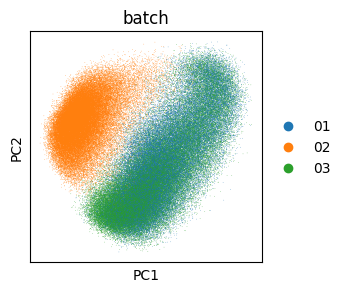

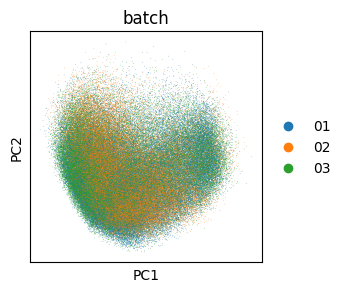

In [65]:
sc.pl.pca(adata_before_correction, color="batch")
sc.pl.pca(adata_after_correction, color="batch")

In [66]:
for i in np.unique(data_index.CPD_NAME):
    print(i)

A4GALT
A4GNT
ABCA7
ABCA9
ABCC4
ABHD1
ABHD11
ABHD14B
ABI1
ABI3
ABLIM2
ACAA2
ACAD10
ACCS
ACOT2
ACSBG2
ACSS1
ACTL7B
ACTR5
ACTRT3
ADAP1
ADIPOR1
AGBL2
AGBL4
AGMAT
AGPAT2
AGR2
AHCYL1
AHSA1
AKAP3
AKAP9
AKR1A1
AKR1E2
ALDH1L1
ALG3
ALG9
ALYREF
AMDHD2
AMMECR1
ANAPC10
ANAPC11
ANAPC7
ANGPT4
ANGPTL4
ANGPTL6
ANKIB1
ANTXR1
AP5Z1
APC2
APH1A
APH1B
APIP
APOBEC2
APOL3
APOL4
APOL5
APPBP2
APTX
AREL1
ARFGAP2
ARHGAP10
ARHGAP11A
ARHGAP25
ARID3B
ARIH2
ARL14
ARL15
ARL6
ARL6IP5
ARMCX2
ARPC1A
ARPC5L
ARSJ
ASAP1
ASCC1
ASCC3
ASPN
ATF7
ATG13
ATG7
ATL1
ATP2C1
ATP5H
ATP6AP2
ATP6V0A4
ATP6V1H
ATP8A2
ATP8B4
AZIN1
B3GALT5
B3GNT2
B3GNT3
BAIAP2
BASP1
BCAS2
BCL11A
BCL7B
BCO2
BICC1
BLM
BMS1
BNC2
BPIFA1
BRD8
BRIP1
BTBD1
BTBD10
BTN2A3P
BTN3A3
BTNL3
BZW1
C14orf2
C1D
C1orf61
C2CD2L
C2CD5
CALCOCO2
CALY
CAP1
CAP2
CARD11
CARD6
CARM1
CARTPT
CBLL1
CBR4
CBX1
CCL26
CCL27
CCNI
CCNO
CCP110
CD244
CD2BP2
CD83
CDADC1
CDC42EP2
CDHR2
CDHR5
CDIPT
CDK2AP2
CDON
CECR1
CELF1
CEP104
CEP57
CEPT1
CFDP1
CFTR
CHAF1A
CHD9
CHERP
CHL1
CHMP6
CHPF2
CHRAC1
CHST

# CONTROLS

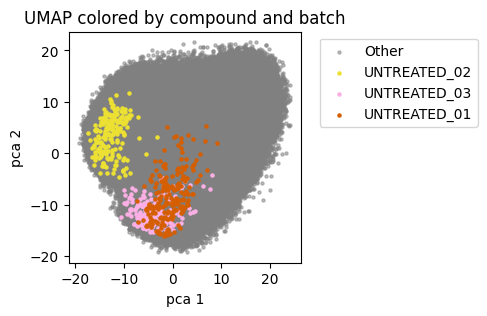

In [33]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "UNTREATED", dim_red="pca")

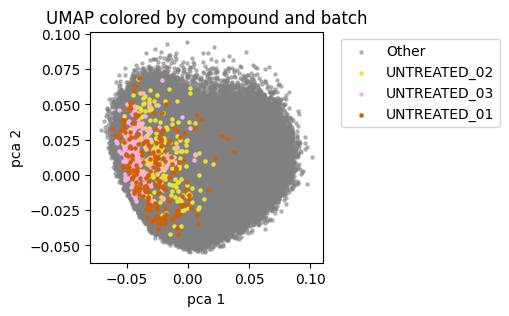

In [68]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "UNTREATED", dim_red="pca")

# Strong Perturbations

EPHX3

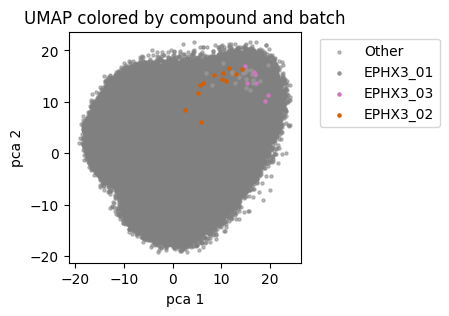

In [69]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "EPHX3", dim_red="pca")

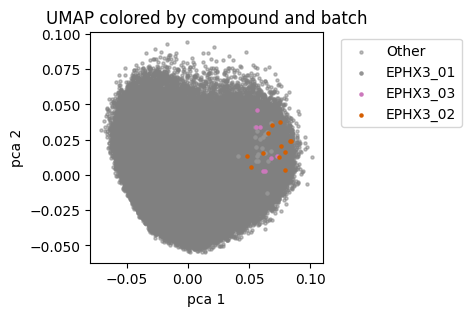

In [70]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "EPHX3", dim_red="pca")

A4GALT

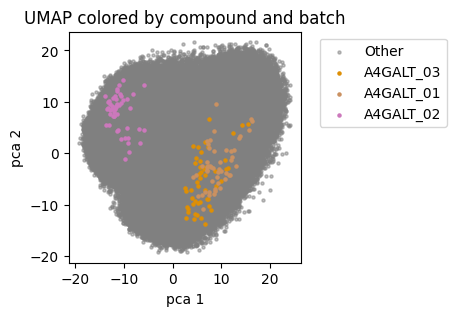

In [71]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "A4GALT", dim_red="pca")

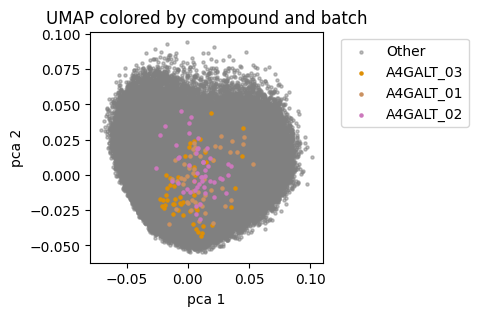

In [72]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "A4GALT", dim_red="pca")

TSFM

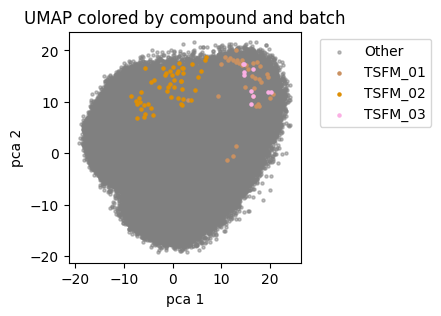

In [73]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "TSFM", dim_red="pca")

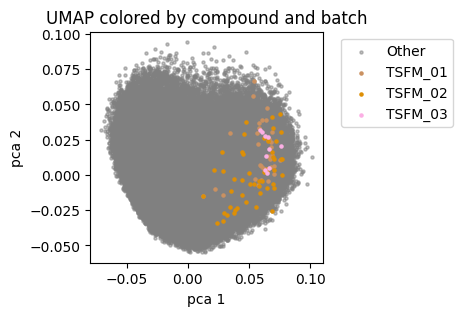

In [74]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "TSFM", dim_red="pca")

SNTG2

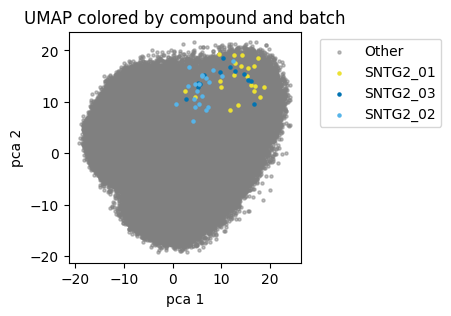

In [75]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "SNTG2", dim_red="pca")

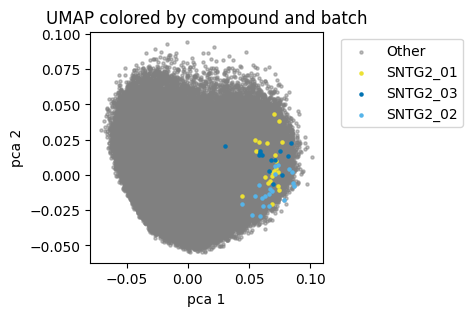

In [76]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "SNTG2", dim_red="pca")

NAA15

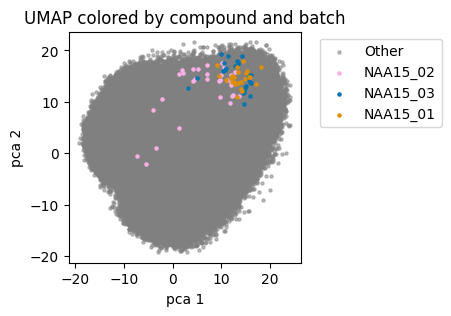

In [77]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "NAA15", dim_red="pca")

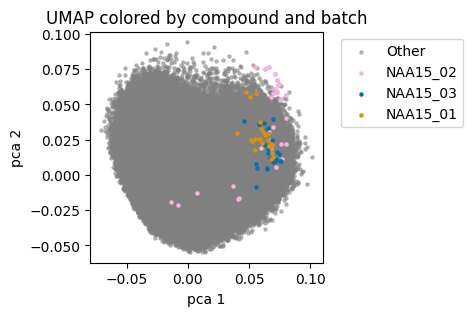

In [78]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "NAA15", dim_red="pca")

NXF1

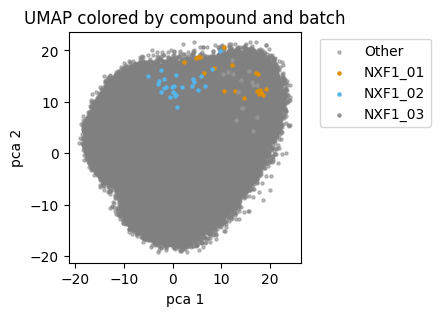

In [79]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "NXF1", dim_red="pca")

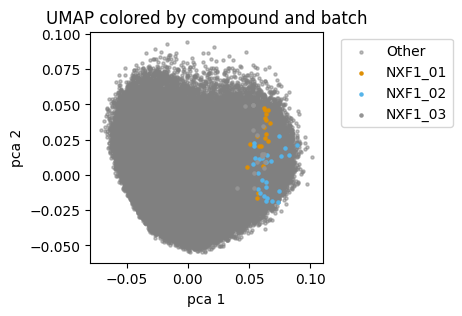

In [80]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "NXF1", dim_red="pca")

GATAD2A

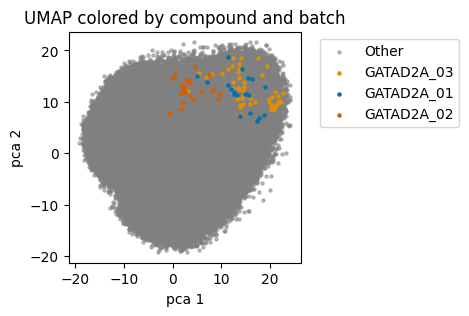

In [83]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "GATAD2A", dim_red="pca")

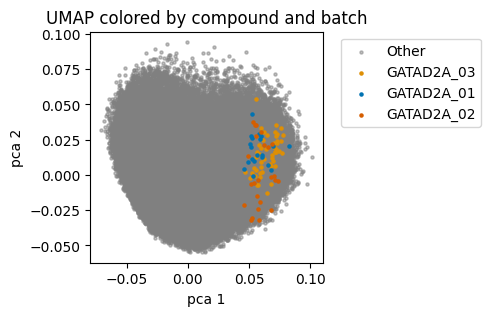

In [84]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "GATAD2A", dim_red="pca")

TTN	

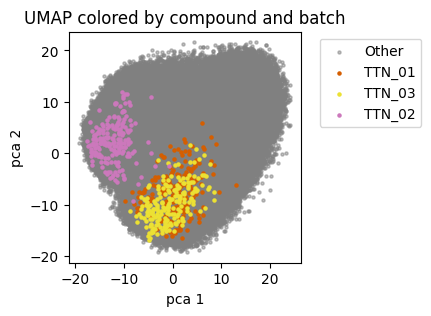

In [85]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "TTN", dim_red="pca")

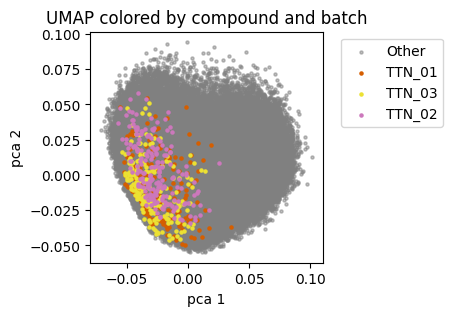

In [86]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "TTN", dim_red="pca")

Louvain before and after correction 
- clusters you recover?
- after clustering corresponds to that mode of action
- Show correction data above and bio below 

NIPBL	

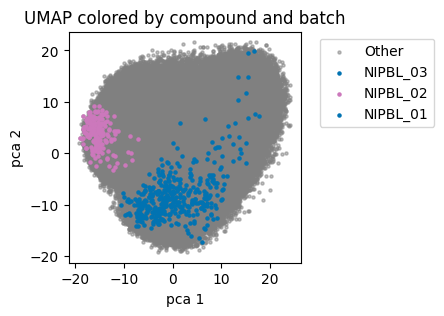

In [87]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "NIPBL", dim_red="pca")

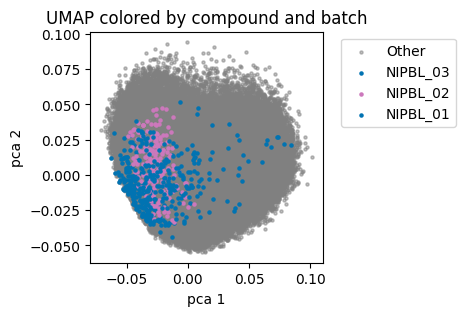

In [88]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "NIPBL", dim_red="pca")

GRN	

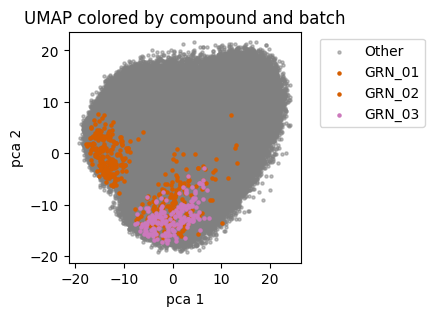

In [89]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "GRN", dim_red="pca")

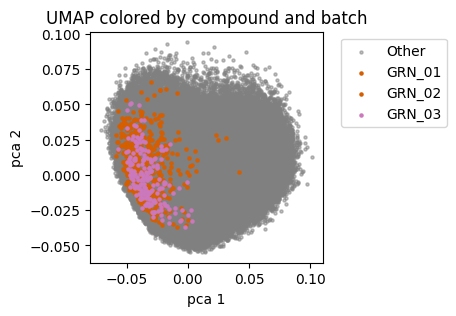

In [90]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "GRN", dim_red="pca")

CYP27A1

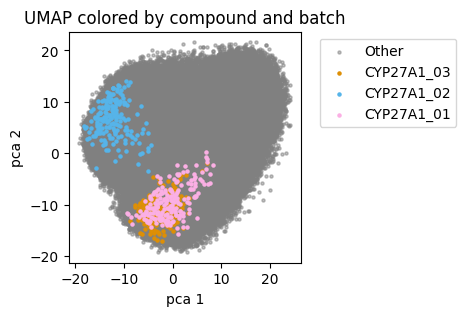

In [91]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "CYP27A1", dim_red="pca")

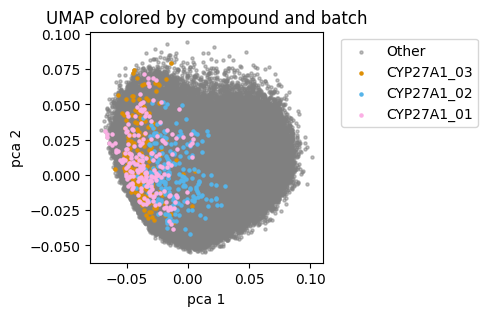

In [94]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "CYP27A1", dim_red="pca")

Variable

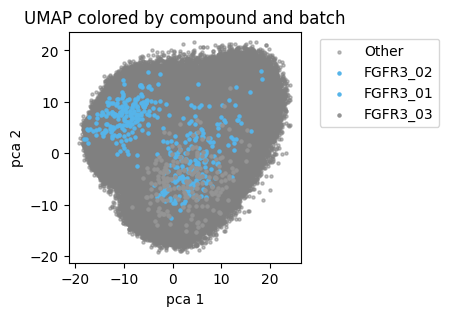

In [99]:
plot_umap_with_compound_and_batch(adata_before_correction, "compound", "batch", "FGFR3", dim_red="pca")

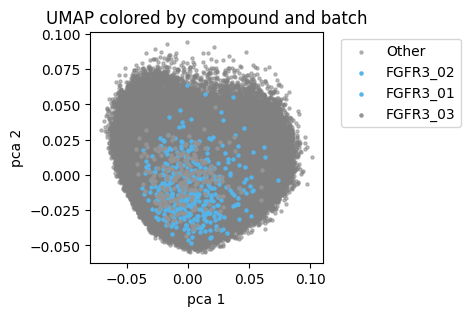

In [100]:
plot_umap_with_compound_and_batch(adata_after_correction, "compound", "batch", "FGFR3", dim_red="pca")

# LEIDEN cluster

In [36]:
sc.tl.leiden(adata_after_correction)

In [37]:
sc.tl.leiden(adata_before_correction)

In [ ]:
adata_after_correction.write_h5ad("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/featurized_anndata/rxrx1/rxrx1_adata_after_transf_leiden.h5ad")
# adata_after_correction = sc.read_h5ad("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/featurized_anndata/rxrx1/rxrx1_adata_after_transf_leiden.h5ad")

In [ ]:
adata_before_correction.write_h5ad("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/featurized_anndata/rxrx1/rxrx1_adata_before_transf_leiden.h5ad")
# adata_before_correction = sc.read_h5ad("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/featurized_anndata/rxrx1/rxrx1_adata_before_transf_leiden.h5ad")

In [ ]:
sc.pl.pca(adata_after_correction, color="leiden")

In [ ]:
sc.pl.pca(adata_before_correction, color="leiden")

In [ ]:
# # Find the cluster with largest amount of controls
# adata_after_correction_ctrl = adata_after_correction[adata_after_correction.obs.compound=="UNTREATED"]
# adata_after_correction_ctrl.obs["compunt_cluster"]

# np.unique(list(zip(adata_after_correction.obs.compound, adata_after_correction.obs.leiden)), return_counts=True)

In [ ]:
for cluster in np.unique(adata_after_correction.obs["leiden"]):
    adata_cluster = adata_after_correction[adata_after_correction.obs.leiden==cluster]
    cpd_values = adata_cluster.obs.compound.value_counts()
    try:
        ctrl_frac = cpd_values["UNTREATED"]/cpd_values.sum()
        print(f"For cluster {cluster}, control fraction is {ctrl_frac}")
    except:
        print("No controls in the cluster")
        continue

In [ ]:
ctrl_frac

## Compute cluster purity

In [41]:
def compute_purity_scores(adata, metric='entropy'):
    """
    Compute batch and compound purity scores for each cluster.

    Args:
    adata (AnnData): Annotated data object containing cluster, batch, and compound annotations.
    metric (str): 'entropy' or 'gini' to specify the purity metric to use (default is 'entropy').

    Returns:
    pd.DataFrame: DataFrame containing purity scores for each cluster.
                  Columns: cluster, batch_purity, compound_purity
    """

    # Extract cluster, batch, and compound annotations
    clusters = adata.obs['leiden']
    batches = adata.obs['batch']
    compounds = adata.obs['compound']

    # Create a DataFrame to store purity scores
    purity_df = pd.DataFrame(columns=['cluster', 'batch', 'compound'])

    # Iterate over each cluster
    for cluster in clusters.unique():
        # Filter data for the current cluster
        cluster_indices = clusters[clusters == cluster].index
        cluster_batches = batches.loc[cluster_indices]
        cluster_compounds = compounds.loc[cluster_indices]

        # Compute batch distribution
        batch_counts = cluster_batches.value_counts(normalize=True)
        # Compute compound distribution
        compound_counts = cluster_compounds.value_counts(normalize=True)

        # Compute batch purity using specified metric
        if metric == 'entropy':
            batch_purity = -np.sum(batch_counts * np.log2(batch_counts))
        elif metric == 'gini':
            batch_purity = 1 - np.sum(batch_counts ** 2)
        else:
            raise ValueError("Invalid metric. Please choose 'entropy' or 'gini' for batch purity.")

        # Compute compound purity using specified metric
        if metric == 'entropy':
            compound_purity = -np.sum(compound_counts * np.log2(compound_counts))
        elif metric == 'gini':
            compound_purity = 1 - np.sum(compound_counts ** 2)
        else:
            raise ValueError("Invalid metric. Please choose 'entropy' or 'gini' for compound purity.")

        # Add purity scores to DataFrame
        purity_df = purity_df.append({'cluster': cluster, 'batch': batch_purity, 'compound': compound_purity},
                                     ignore_index=True)

    return purity_df

Entropy

In [42]:
compute_purity_scores(adata_after_correction, metric="entropy").mean(0)

cluster     9.821194e+19
batch       1.517602e+00
compound    9.312321e+00
dtype: float64

In [43]:
compute_purity_scores(adata_before_correction, metric="entropy").mean(0)

cluster     3.145641e+28
batch       7.626126e-01
compound    8.547818e+00
dtype: float64

In [44]:
compute_purity_scores(adata_after_correction, metric="gini").mean(0)

cluster     9.821194e+19
batch       6.364760e-01
compound    9.978367e-01
dtype: float64

In [45]:
compute_purity_scores(adata_before_correction, metric="gini").mean(0)

cluster     3.145641e+28
batch       3.247947e-01
compound    9.473074e-01
dtype: float64

## PER CLUSTER PATHWAY ANALYSIS

In [46]:
def pathway_enrichment_per_cluster(adata, cluster_column='leiden', gene_column="compound"):

    # Initialize dictionary to store pathway enrichment results
    pathway_enrichment_results = {}

    # Iterate over each cluster
    for cluster in tqdm(adata.obs[cluster_column].unique()):
        # Subset data for the current cluster
        cluster_data = adata[adata.obs[cluster_column] == cluster].copy()

        enrichment_results = sc.queries.enrich(list(np.unique(cluster_data.obs[gene_column])))

        # Store pathway enrichment results for the cluster
        pathway_enrichment_results[cluster] = enrichment_results

    return pathway_enrichment_results

In [47]:
enrichment_results_before_correction = pathway_enrichment_per_cluster(adata_before_correction, 
                                                                       cluster_column='leiden',
                                                                       gene_column="compound")

100%|██████████| 20/20 [00:50<00:00,  2.52s/it]


In [48]:
enrichment_results_after_correction = pathway_enrichment_per_cluster(adata_after_correction, 
                                                                       cluster_column='leiden',
                                                                       gene_column="compound")

100%|██████████| 16/16 [00:42<00:00,  2.63s/it]


Possible paths cluster 9:
* Golgi apparatus
* Golgi membrane
* endoplasmic reticulum subcompartment
* endoplasmic reticulum
* endoplasmic reticulum membrane

In [49]:
enriched_9_14 = differentially_enriched_paths(enrichment_results_after_correction["9"], 
                              enrichment_results_after_correction["14"])
print(enriched_9_14[0][enriched_9_14[0]>0].index)
print(enriched_9_14[1])

Index(['SWI/SNF superfamily-type complex', 'nucleoplasm', 'kidney',
       'ATPase complex', 'catalytic complex', 'Golgi apparatus',
       'Swr1 complex', 'INO80-type complex', 'acyltransferase activity',
       'kidney; cells in tubules[≥Low]', 'transferase complex', 'lung',
       'colon', 'lung; macrophages[≥Low]', 'membrane-bounded organelle',
       'glycosylation', 'organelle membrane',
       'glycoprotein biosynthetic process',
       'tonsil; germinal center cells[≥Low]', 'Golgi membrane'],
      dtype='object', name='name')
['ATP-dependent chromatin remodeling'
 'Factor: USF1; motif: NNNNGTCACGTGGN' 'NuA4/Tip60 HAT complex'
 'aminoacyltransferase activity' 'appendix' 'ciliary pocket'
 'ciliary pocket membrane' 'disulfide oxidoreductase activity'
 'histone H2A acetyltransferase activity' 'histone deacetylase complex'
 'import into the mitochondrion' 'intracellular organelle lumen'
 'intracellular protein-containing complex'
 'lymph node; germinal center cells[≥Low]' 'macromol

In [50]:
enriched_7_14 = differentially_enriched_paths(enrichment_results_after_correction["7"], 
                              enrichment_results_after_correction["14"])
print(enriched_7_14[0][enriched_7_14[0]>0].index)
print(enriched_7_14[1])

Index(['catalytic complex', 'kidney', 'SWI/SNF superfamily-type complex',
       'ATPase complex', 'acyltransferase activity', 'nucleoplasm', 'rectum',
       'Golgi apparatus', 'colon', 'endomembrane system', 'Golgi membrane',
       'lung', 'INO80-type complex', 'membrane-bounded organelle',
       'testis; Leydig cells[≥Medium]', 'organelle', 'organelle membrane',
       'kidney; cells in tubules[≥Low]', 'transferase complex',
       'adrenal gland; glandular cells[≥Medium]', 'testis; Leydig cells[≥Low]',
       'salivary gland', 'salivary gland; glandular cells[≥Low]',
       'endoplasmic reticulum', 'Swr1 complex',
       'bone marrow; hematopoietic cells[≥Low]', 'bone marrow',
       'tonsil; germinal center cells[≥Low]',
       'duodenum; glandular cells[≥Medium]', 'lung; macrophages[≥Low]',
       'intracellular membrane-bounded organelle',
       'cellular anatomical entity', 'epididymis',
       'epididymis; glandular cells[≥Low]', 'cytoplasm', 'glycosylation',
       'placen

In [51]:
enriched_11_14 = differentially_enriched_paths(enrichment_results_after_correction["11"], 
                              enrichment_results_after_correction["14"])
print(enriched_11_14[0][enriched_11_14[0]>0].index)
print(enriched_11_14[1])

Index(['nucleoplasm', 'acyltransferase activity', 'kidney', 'Golgi membrane',
       'colon', 'testis; Leydig cells[≥Medium]', 'protein binding', 'rectum',
       'Golgi apparatus', 'organelle membrane', 'glycosylation',
       'tonsil; germinal center cells[≥Low]', 'kidney; cells in tubules[≥Low]',
       'catalytic complex', 'protein localization',
       'cellular macromolecule localization', 'helicase activity',
       'transferase activity', 'colon; glandular cells[≥Low]',
       'bounding membrane of organelle', 'skin 1; Langerhans[≥Medium]',
       'negative regulation of axon extension',
       'glycoprotein biosynthetic process',
       'adrenal gland; glandular cells[≥Medium]',
       'glycoprotein metabolic process', 'rectum; glandular cells[≥Low]',
       'testis; Leydig cells[≥Low]', 'Factor: pax-6; motif: NYACGCNYSANYGMNCN',
       'skin 1; keratinocytes[≥Low]', 'placenta',
       'SWI/SNF superfamily-type complex', 'macromolecule localization',
       'endomembrane syste

In [52]:
enrichment_results_after_correction["11"].head(20)

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,GO:CC,GO:0005737,cytoplasm,2.389033e-30,True,"""The contents of a cell excluding the plasma m...",12345,754,576,22097,0.763926,0.046659,query_1,"[GO:0005622, GO:0110165]"
1,GO:MF,GO:0005515,protein binding,7.228378e-13,True,"""Binding to a protein."" [GOC:go_curators]",14838,755,644,20212,0.852980,0.043402,query_1,[GO:0005488]
2,GO:MF,GO:0003824,catalytic activity,1.218233e-10,True,"""Catalysis of a biochemical reaction at physio...",5758,755,307,20212,0.406623,0.053317,query_1,[GO:0003674]
3,GO:CC,GO:0031090,organelle membrane,6.248738e-10,True,"""A membrane that is one of the two lipid bilay...",3770,754,204,22097,0.270557,0.054111,query_1,"[GO:0016020, GO:0043227]"
4,GO:CC,GO:0012505,endomembrane system,2.450522e-09,True,"""A collection of membranous structures involve...",4777,754,242,22097,0.320955,0.050659,query_1,[GO:0110165]
5,GO:CC,GO:0000139,Golgi membrane,3.656438e-09,True,"""The lipid bilayer surrounding any of the comp...",671,754,60,22097,0.079576,0.089419,query_1,"[GO:0005794, GO:0098588]"
6,GO:CC,GO:0005794,Golgi apparatus,1.189883e-07,True,"""A membrane-bound cytoplasmic organelle of the...",1629,754,104,22097,0.137931,0.063843,query_1,"[GO:0005737, GO:0012505, GO:0043231]"
7,GO:CC,GO:0005654,nucleoplasm,3.660172e-07,True,"""That part of the nuclear content other than t...",4220,754,211,22097,0.279841,0.050000,query_1,"[GO:0031981, GO:0110165]"
8,GO:CC,GO:0043227,membrane-bounded organelle,1.058845e-06,True,"""Organized structure of distinctive morphology...",15671,754,604,22097,0.801061,0.038543,query_1,[GO:0043226]
9,GO:CC,GO:0031984,organelle subcompartment,1.120906e-06,True,"""A compartment that consists of a lumen and an...",1521,754,96,22097,0.127321,0.063116,query_1,"[GO:0043227, GO:0043229, GO:0110165]"


In [53]:
enriched_5_14 = differentially_enriched_paths(enrichment_results_after_correction["5"], 
                              enrichment_results_after_correction["14"])
print(enriched_5_14[0][enriched_5_14[0]>0].index)
print(enriched_5_14[1])

Index(['cytoplasm', 'protein binding', 'endomembrane system', 'kidney',
       'membrane-bounded organelle', 'nucleoplasm', 'organelle',
       'SWI/SNF superfamily-type complex',
       'intracellular membrane-bounded organelle', 'catalytic complex',
       'Golgi apparatus', 'colon', 'organelle membrane',
       'testis; Leydig cells[≥Medium]', 'intracellular anatomical structure',
       'rectum', 'intracellular organelle', 'ATPase complex',
       'helicase activity', 'acyltransferase activity',
       'ATP-dependent activity', 'localization',
       'kidney; cells in tubules[≥Low]',
       'adrenal gland; glandular cells[≥Medium]',
       'tonsil; germinal center cells[≥Low]',
       'Intra-Golgi and retrograde Golgi-to-ER traffic',
       'testis; Leydig cells[≥Low]', 'macromolecule localization',
       'Golgi membrane', 'protein localization',
       'rectum; glandular cells[≥Low]', 'cellular macromolecule localization',
       'colon; glandular cells[≥Low]', 'INO80-type comple

# Check cluster images

In [54]:
def plot_cluster_images(dataset_path, adata, cluster, n_images=100):
    adata_cluster = adata[adata.obs.leiden==cluster]
    images = []
    for i, row in tqdm(enumerate(adata_cluster.obs.iterrows())):
        view = row[1]["view"]
        image_path = dataset_path / f"{row[1].batch}_{row[1].plate}" / row[1].well / f"{view}_{row[1].no}.npy"
        img = np.load(image_path)
        images.append(img)
        if i == n_images:
            break
    return np.stack(images, axis=0)

def print_images_by_organelle(images, organelle_idx):
    for img in images:
        plt.figure(figsize=(1,1))
        plt.imshow(img[:,:, organelle_idx])
        plt.show()

In [55]:
dataset_path = Path("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/datasets/rxrx1_transported")

In [56]:
images_9 = plot_cluster_images(dataset_path, adata_after_correction, "9")

100it [00:01, 64.58it/s]


In [57]:
images_14 = plot_cluster_images(dataset_path, adata_after_correction, "14")

100it [00:01, 66.16it/s]


In [58]:
images_11 = plot_cluster_images(dataset_path, adata_after_correction, "11")

100it [00:01, 64.38it/s]


In [59]:
images_1 = plot_cluster_images(dataset_path, adata_after_correction, "1")

100it [00:01, 64.37it/s]


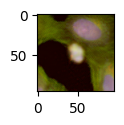

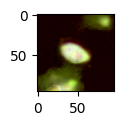

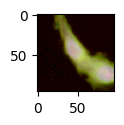

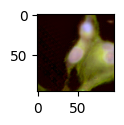

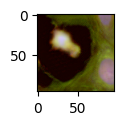

...

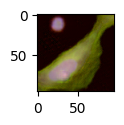

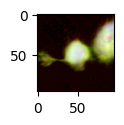

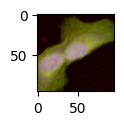

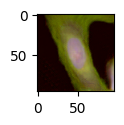

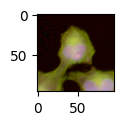

In [60]:
print_images_by_organelle(images_9, [5, 2, 0])

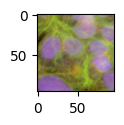

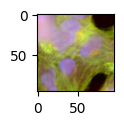

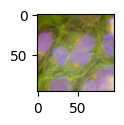

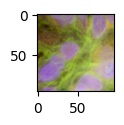

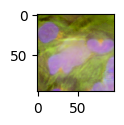

...

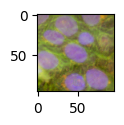

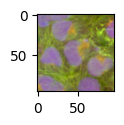

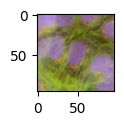

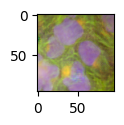

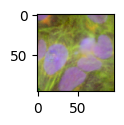

In [61]:
print_images_by_organelle(images_14, [5, 2, 0])

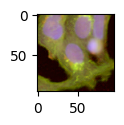

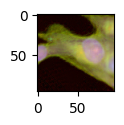

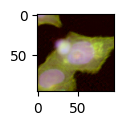

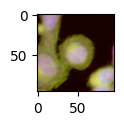

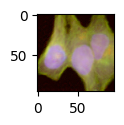

...

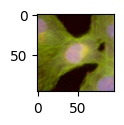

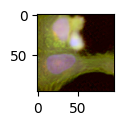

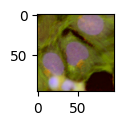

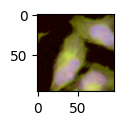

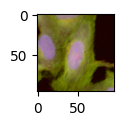

In [62]:
print_images_by_organelle(images_11, [5, 2, 0])

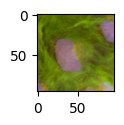

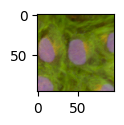

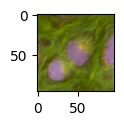

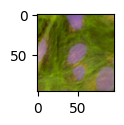

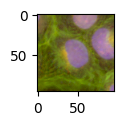

...

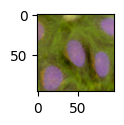

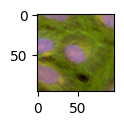

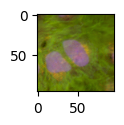

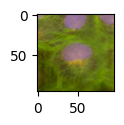

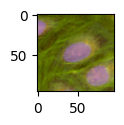

In [63]:
print_images_by_organelle(images_1, [5, 2, 0])

**Cross-plot clusters**

In [64]:
def plot_highlighted_cells(adata1, adata2, cluster_label):
    # Step 1: Identify cells belonging to the specified cluster in the first AnnData
    selected_cells_mask = adata1.obs['leiden'] == cluster_label
    selected_cells_indices = np.where(selected_cells_mask)[0]

    # Step 2: Subset the second AnnData using the selected cell indices
    highlighted_adata2 = adata2[selected_cells_indices, :]

    # Step 3: Plot all cells in grey
    plt.scatter(adata2.obsm['X_pca'][:, 0],  # assuming UMAP coordinates are available
                adata2.obsm['X_pca'][:, 1],  # assuming UMAP coordinates are available
                color='grey', alpha=0.5, label='Other cells', s=5)

    # Step 4: Plot highlighted cells in red
    plt.scatter(highlighted_adata2.obsm['X_pca'][:, 0],  # assuming UMAP coordinates are available
                highlighted_adata2.obsm['X_pca'][:, 1],  # assuming UMAP coordinates are available
                color='red', alpha=0.5, label='Highlighted cells', s=5)

    adata2_ctr = adata2[adata2.obs.compound=="UNTREATED"]
    plt.scatter(adata2_ctr.obsm['X_pca'][:, 0],  # assuming UMAP coordinates are available
                adata2_ctr.obsm['X_pca'][:, 1],  # assuming UMAP coordinates are available
                color='blue', alpha=0.5, label='Highlighted cells', s=5)

    plt.xlabel('PC 1')
    plt.ylabel('PC 2')
    plt.title('Highlighted Cells from Cluster: ' + cluster_label)
    plt.legend()
    plt.show()

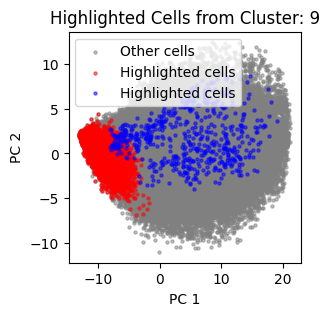

In [65]:
plot_highlighted_cells(adata_after_correction, adata_before_correction, "9")

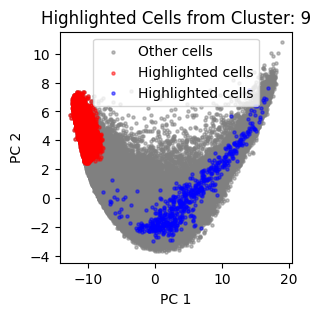

In [66]:
plot_highlighted_cells(adata_after_correction, adata_after_correction, "9")

**Final bit: check the cells in the intersecting area**

In [67]:
dataset_path_uncorrected = Path("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/datasets/rxrx1")

In [68]:
intereecting_region_uncorrected = plot_cluster_images(dataset_path_uncorrected, adata_before_correction, "4", n_images=100)

100it [00:01, 69.47it/s]


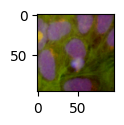

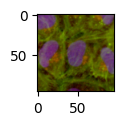

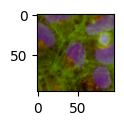

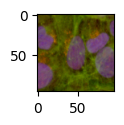

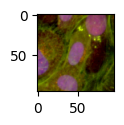

...

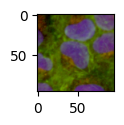

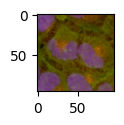

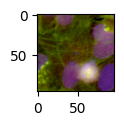

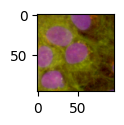

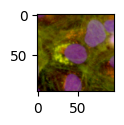

In [69]:
print_images_by_organelle(intereecting_region_uncorrected, [5, 2, 0])

In [70]:
features = pd.read_csv("/lustre/groups/ml01/datasets/projects/cpg0000_alessandro/cpg0000_metadata/BR00116991/BR00116991.csv")

## Run Cellpose and measure features with scikit learn

In [126]:
from cellpose import models, utils
from skimage.feature import graycomatrix, graycoprops

Now collect the `regprops` for both the clusters 14 and 9 in the transformed cells

In [164]:
from skimage.measure import regionprops, regionprops_table

def compute_texture_features(image):
    """
    Compute texture features using GLCM (Gray-Level Co-occurrence Matrix).

    Parameters:
    - image: grayscale image.

    Returns:
    - texture_features: dictionary containing texture features.
    """
    # Compute GLCM
    distances = [1]
    angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
    glcm = graycomatrix(image, distances=distances, angles=angles, levels=256, symmetric=True, normed=True)
    
    # Compute texture properties from GLCM
    texture_props = ['contrast', 'dissimilarity', 'homogeneity', 'ASM', 'energy', 'correlation']
    texture_features = {}
    for prop in texture_props:
        texture_features[prop] = graycoprops(glcm, prop).ravel()[0]

    return texture_features

def cellpose_segmentation(images):
    """
    Perform Cellpose segmentation on a batch of images and measure all available region properties.

    Parameters:
    - images: numpy array of shape (N, H, W) containing N images.

    Returns:
    - region_props: a table of region properties for each segmented region.
    """
    # Define Cellpose model for 2D images
    model = models.Cellpose(gpu=True, model_type='cyto')  # gpu=True if you have GPU support

    region_props_res = {}
    texture_features_res = {}

    # Process each image in the batch
    for i in tqdm(range(len(images))):
        image = images[i]
        # Segment the cells
        masks, flows, styles, diams = model.eval(image, diameter=None, channels=[0, 0])
        
        # Get region properties
        props = regionprops_table(masks.astype(int), image, properties=('area', 'area_bbox', 'area_convex', 'area_filled',
                                                                'axis_major_length', 'axis_minor_length', 'bbox', 
                                                                'eccentricity', 'equivalent_diameter',
                                                                'euler_number', 'extent', 'feret_diameter_max', 
                                                                'intensity_max', 'intensity_mean', 'intensity_min', 'label', 'moments',
                                                                'moments_central', 'moments_hu', 'moments_normalized', 'moments_weighted',
                                                                'moments_weighted_central', 'moments_weighted_hu', 'moments_weighted_normalized',
                                                                 'perimeter', 'perimeter_crofton', 'solidity'))

        # Compute texture features
        texture_features = compute_texture_features(image)

        for key in props:
            if key not in region_props_res:
                region_props_res[key] = props[key]
            else:
                region_props_res[key] = np.concatenate([region_props_res[key], props[key]])

        for key in texture_features:
            if key not in texture_features_res:
                texture_features_res[key] = np.array([texture_features[key]])
            else:
                texture_features_res[key] = np.concatenate([texture_features_res[key], np.array([texture_features[key]])])
    return region_props_res, texture_features_res

In [165]:
features_9_regprops, features_9_texture = cellpose_segmentation(images_9[:,:,:,5])

100%|██████████| 101/101 [00:58<00:00,  1.71it/s]


In [166]:
features_14_regprops, features_14_texture  = cellpose_segmentation(images_14[:,:,:,5])

100%|██████████| 101/101 [00:59<00:00,  1.69it/s]


In [167]:
features_9_regprops = pd.DataFrame(features_9_regprops)
features_14_regprops = pd.DataFrame(features_14_regprops)

In [168]:
features_9_texture = pd.DataFrame(features_9_texture)
features_14_texture = pd.DataFrame(features_14_texture)

In [172]:
features_9_texture.mean(0)

contrast         84.255643
dissimilarity     6.169333
homogeneity       0.216522
ASM               0.002279
energy            0.046442
correlation       0.985399
dtype: float64

In [173]:
features_14_texture.mean(0)

contrast         56.132152
dissimilarity     5.369218
homogeneity       0.197583
ASM               0.000597
energy            0.024365
correlation       0.961016
dtype: float64

In [176]:
features_14_regprops.mean(0)["intensity_mean"]

154.62220671846248

In [177]:
features_9_regprops.mean(0)["intensity_mean"]

110.09996925644874